# Code Implementation

In this section, we set up the working directory and color palettes for visualization.



In [12]:
!ls

 class_names.txt			   __pycache__
 helpers.py				   ros_seg.py
 ImageSets				   saved_figure.png
 JPEGImages				   Scratch_pretrained_Comarison.ipynb
 losses.py				   SegmentationClassPNG
 model					   SegmentationClassSubset
 model_0.00003.h5			   SegmentationClassVisualization
 model_0.05.h5				   Segmentation_testing.ipynb
 output					   Segmentation_testing.py
'Preprocessing _and_visualization.ipynb'   seg_ros.py
 Pre-trained_weight_training.ipynb	   test.py
 pr.py



Classes to detect, with corresponding colors:


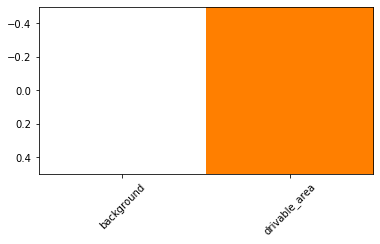

In [13]:
import sys
import cv2
import helpers
from helpers import *
%matplotlib inline
from matplotlib.colors import ListedColormap
from matplotlib import cm
from matplotlib import gridspec
from matplotlib import pyplot as plt
import numpy as np
import tensorflow as tf
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split

from tensorflow.keras.layers import Conv2D, Activation, BatchNormalization
from tensorflow.keras.layers import UpSampling2D, Input, Concatenate
from tensorflow.keras.models import Model
from tensorflow.keras.applications import MobileNetV2
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau
from tensorflow.keras.metrics import Recall, Precision
from tensorflow.keras import backend as K
from tensorflow.keras import layers, models
cmap_ref = cm.get_cmap('Set1', 12)
cmap_seg = np.zeros((6, 4))
cmap_seg[0] = [0.7, 0.7, 0.7, 0]
for i in range(1, 6):
  cmap_seg[i] = cmap_ref(i)

cmap_seg = ListedColormap(cmap_seg)
print("\nClasses to detect, with corresponding colors:")
plt.imshow([[0, 1]], cmap=cmap_seg)
plt.xticks([0,1], LABEL_NAMES[[0,1]], rotation=45)

INPUT_SPATIAL = 224

In [14]:
source_raw = 'JPEGImages'
source_mask = 'SegmentationClassSubset'

with open('ImageSets/Segmentation/train.txt', 'r') as fp:
    files_train = [line.rstrip() for line in fp.readlines()]

with open('ImageSets/Segmentation/val.txt', 'r') as fp:
    files_val = [line.rstrip() for line in fp.readlines()]

# Filter down to the subset we are using.
files_train = [f for f in files_train if os.path.isfile(os.path.join('SegmentationClassSubset/' + f + '.npy'))]
files_val = [f for f in files_val if os.path.isfile(os.path.join('SegmentationClassSubset/' + f + '.npy'))]

# Split train-validation into 80:20 instead of the original split.
files_all = np.array(sorted(list(set(files_train).union(set(files_val)))))
index = int(len(files_all) * 0.8)
files_train = files_all[:index]
files_val = files_all[index:]
print(len(files_train), 'training', len(files_val), 'validation')
labels = ['background', 'drivable_area']

370 training 93 validation


# Input Pipeline

In [15]:
gen_train = CustomDataGenerator(source_raw=source_raw,
                                source_mask=source_mask,
                                filenames=files_train.copy(),
                                batch_size=2,
                                target_height=INPUT_SPATIAL,
                                target_width=INPUT_SPATIAL)

gen_val = CustomDataGenerator(source_raw=source_raw,
                              source_mask=source_mask,
                              filenames=files_val.copy(),
                              batch_size=2,
                              target_height=INPUT_SPATIAL,
                              target_width=INPUT_SPATIAL)

Here, we visualize an example pair produced by the generator. The generator marks border/unlabeled pixels as -1, background as 0 and specific classes as 1 and over.

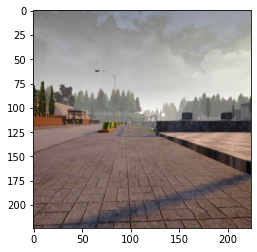

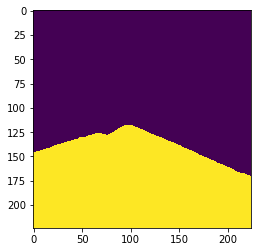

X shape (224, 224, 3) min-mean-max -0.9764705896377563 -0.16556089090382947 0.6000000238418579
Y shape (224, 224, 1) min-mean-max 0 0.3809789540816326 1


In [16]:
X, Y = gen_train[0]
X = X[0]
Y = Y[0]

plt.figure(figsize=(9, 4))

plt.imshow(norm_vis(X, mode='rgb'))
plt.savefig('saved_figure.png')
plt.figure(figsize=(9, 4))
plt.imshow(Y[:, :, 0])
plt.show()


print('X shape', X.shape, 'min-mean-max', X.min(), X.mean(), X.max())
print('Y shape', Y.shape, 'min-mean-max', Y.min(), Y.mean(), Y.max())

# Loss Function for Segmentation

In [17]:
def masked_loss(y_true, y_pred):
    """Defines a masked loss that ignores border/unlabeled pixels (represented as -1).
    
    Args:
      y_true: Ground truth tensor of shape [B, H, W, 1].
      y_pred: Prediction tensor of shape [B, H, W, N_CLASSES].
    """
    gt_validity_mask = tf.cast(tf.greater_equal(y_true[:, :, :, 0], 0), dtype=tf.float32) # [B, H, W]
    
    # The sparse categorical crossentropy loss expects labels >= 0. 
    # We just transform -1 into any valid class label, it will then be masked anyways.
    y_true = K.abs(y_true)
    raw_loss = tf.keras.losses.sparse_categorical_crossentropy(y_true, y_pred)  # [B, H, W].

    masked = gt_validity_mask * raw_loss
    print(masked)
    
    return tf.reduce_mean(masked)
   

#  Visualize results

In [18]:
def run_patch_predict(model, img, deeplab=False):
    """Runs the segmentation model on a single image patch (224 x 224) with flipping.

    Args:
        img: Input image of shape [B, H=224, W=224, C=3] with intensities within range [0,1].

    Returns:
        Segmentation prediction of shape [B, H=224, W=224, N_CLASSES=6].
    """
    img = img.copy() * 255.  # Renorm to [0, 255].
    if not deeplab:
        img = tf.keras.applications.mobilenet_v2.preprocess_input(img)  # Pre-process for MobileNetv2
    else:
        img /= 255.

    left = model.predict(img)
    flip = np.flip(model.predict(np.flip(img, axis=2)), axis=2)

    if deeplab:
        left = left[:, :, CLASSES_TO_KEEP]
        flip = flip[:, :, CLASSES_TO_KEEP]

    return (left + flip) / 2

In [28]:
def show_examples(model, deeplab=False):
  for i in range(0, 92):
    count = 93
    img = cv2.imread(os.path.join(source_raw, files_train[i] + '.jpg')).astype(np.float32) / 255.
    img = np.flip(img, axis=2)
    img = cv2.resize(img, (256, 256), cv2.INTER_LINEAR)
    gt = np.load(os.path.join(source_mask, files_train[i] + '.npy'))

    ret = run_predict(model, np.expand_dims(img, axis=0), deeplab=deeplab)[0]
    if ret.shape[-1] == 21:
      print("Reducing pedicted classes to the classes to keep.")
      ret = ret[:,:,:,CLASSES_TO_KEEP]
    ret_amax = np.argmax(ret, axis=2)

    plt.figure(figsize=(14, 4))
    plt.subplot(1, 3, 1)
    plt.title('input')
    plt.imshow(norm_vis(img, mode='rgb'))
    plt.axis('off')

    plt.subplot(1, 3, 2)
    plt.title('GT')
    plt.imshow(norm_vis(img, mode='rgb'))
    plt.imshow(gt[:, :, 0], cmap=cmap_seg, vmin=0, vmax=N_CLASSES, alpha=0.5)
    plt.axis('off')

    plt.subplot(1, 3, 3)
    plt.title('Prediction')
    plt.imshow(norm_vis(img, mode='rgb'))
    plt.imshow(ret_amax, cmap=cmap_seg, vmin=0, vmax=N_CLASSES, alpha=0.5)
    plt.axis('off')

    plt.figure(figsize=(14, 4))
    for i, label in enumerate(labels[1:]):
        plt.subplot(1, 5, i+1)
        plt.title(label + ': ' + str(round(ret[:, :, i+1].mean(), 2)))
        plt.imshow(ret[:, :, i+1], vmin=0.0, vmax=1.0)
        plt.axis('off')
    plt.show()
    plt.savefig("output/output3", facecolor='w', bbox_inches="tight")

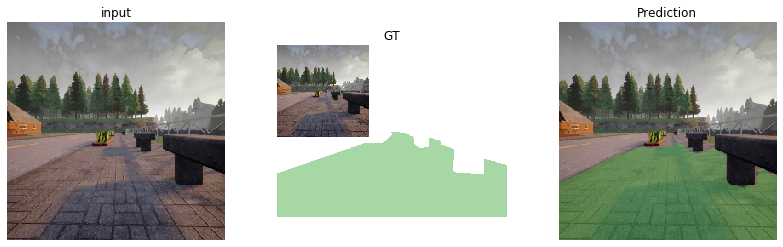

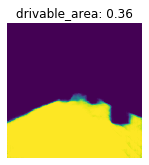

<Figure size 432x288 with 0 Axes>

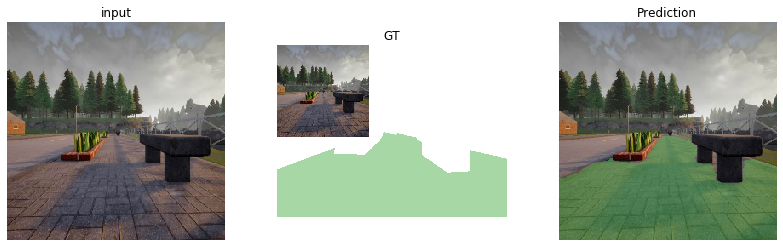

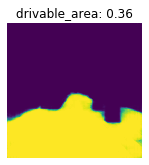

<Figure size 432x288 with 0 Axes>

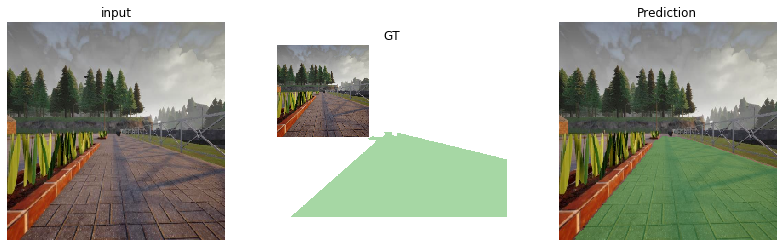

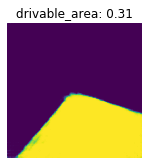

<Figure size 432x288 with 0 Axes>

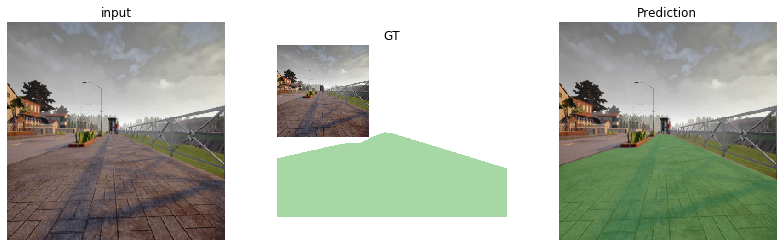

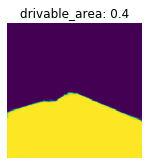

<Figure size 432x288 with 0 Axes>

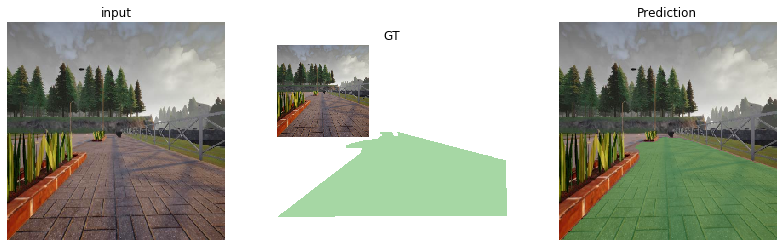

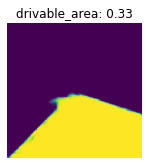

<Figure size 432x288 with 0 Axes>

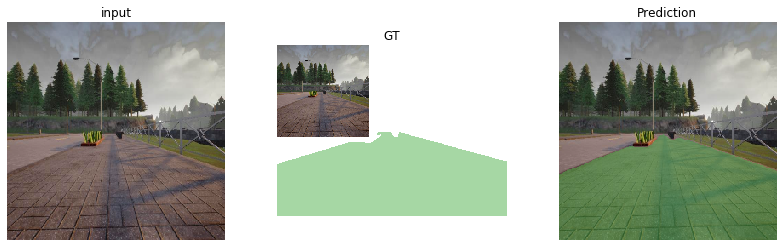

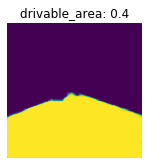

<Figure size 432x288 with 0 Axes>

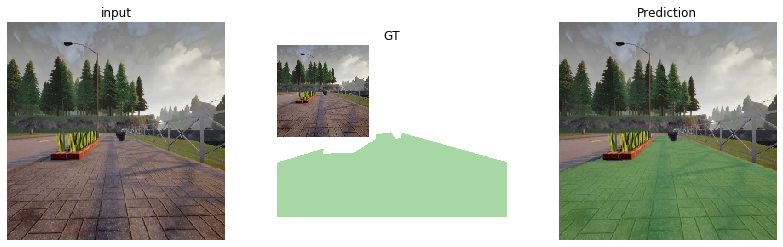

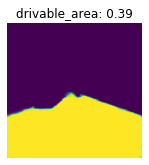

<Figure size 432x288 with 0 Axes>

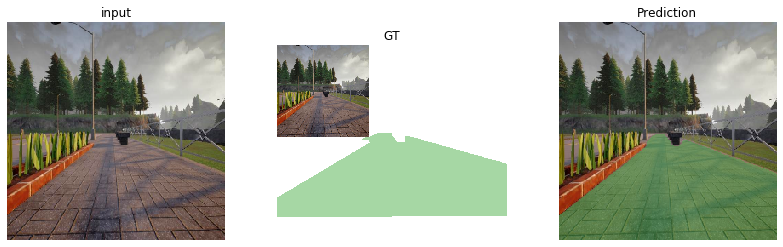

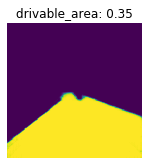

<Figure size 432x288 with 0 Axes>

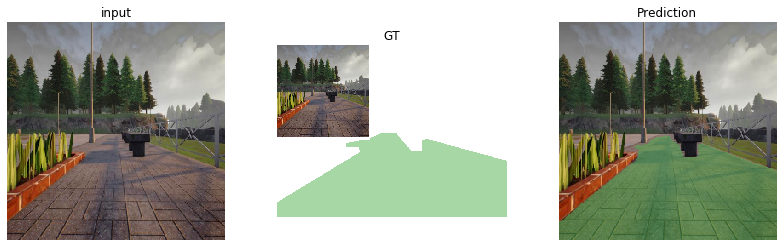

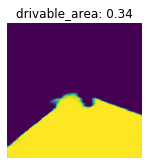

<Figure size 432x288 with 0 Axes>

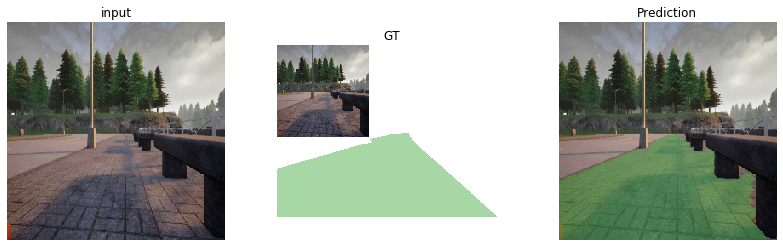

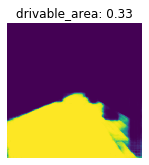

<Figure size 432x288 with 0 Axes>

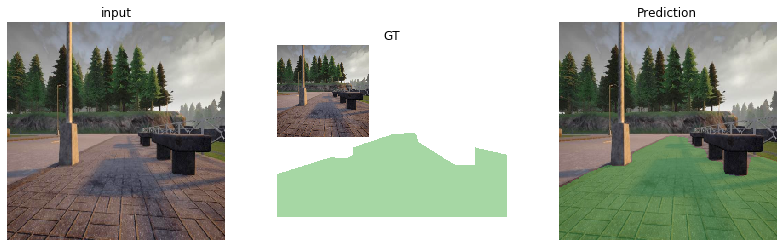

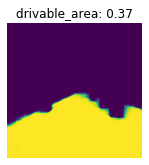

<Figure size 432x288 with 0 Axes>

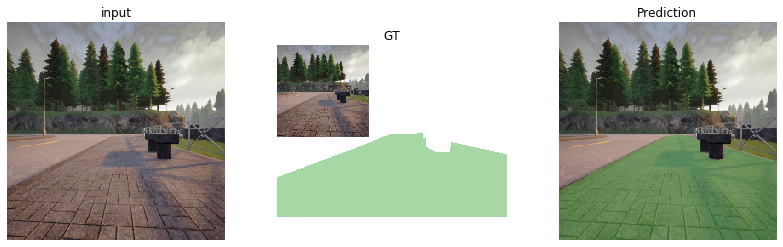

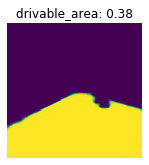

<Figure size 432x288 with 0 Axes>

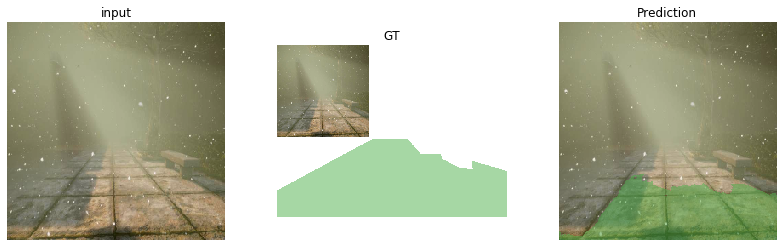

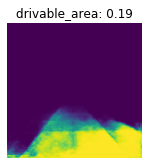

<Figure size 432x288 with 0 Axes>

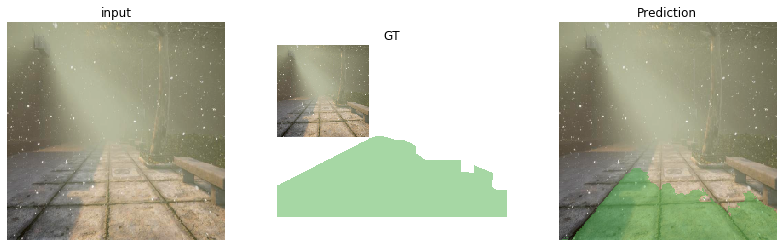

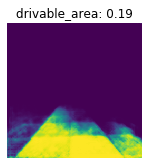

<Figure size 432x288 with 0 Axes>

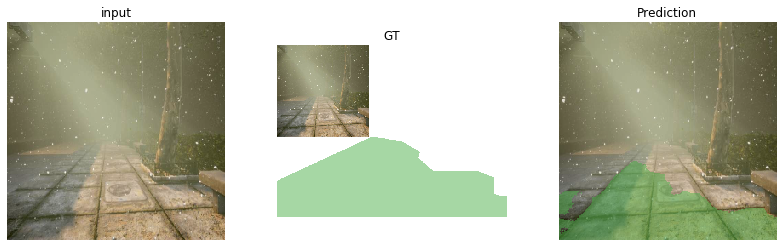

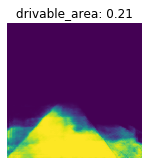

<Figure size 432x288 with 0 Axes>

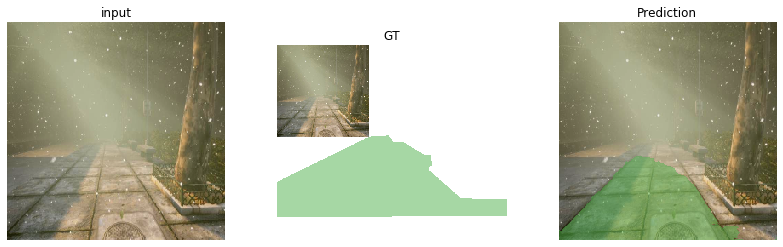

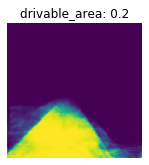

<Figure size 432x288 with 0 Axes>

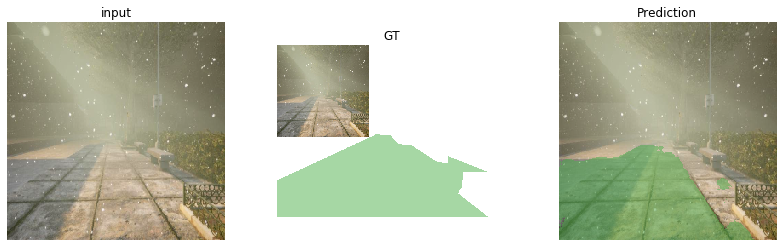

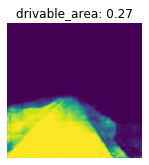

<Figure size 432x288 with 0 Axes>

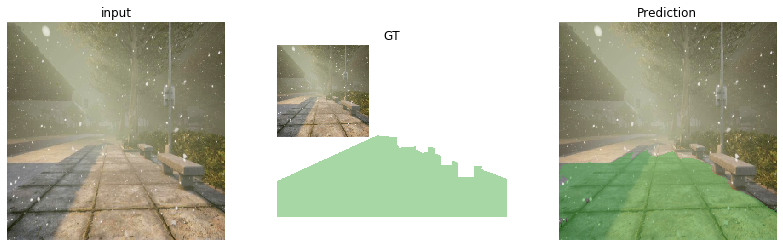

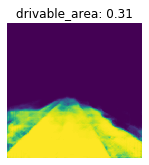

<Figure size 432x288 with 0 Axes>

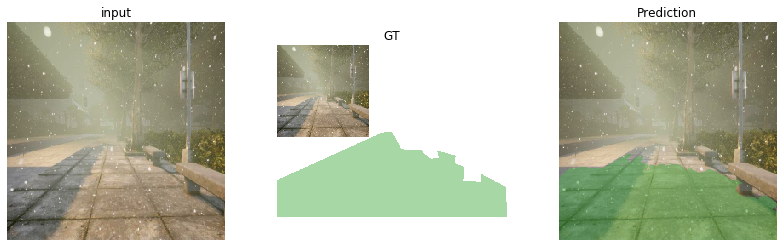

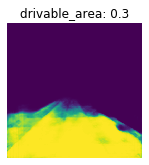

<Figure size 432x288 with 0 Axes>

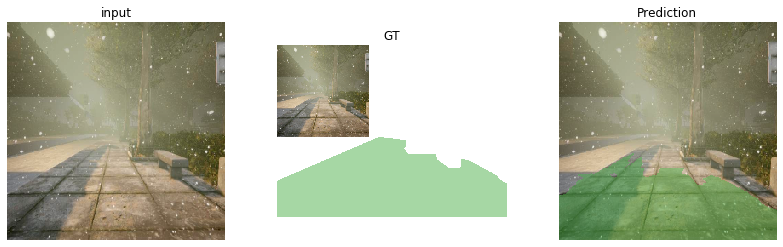

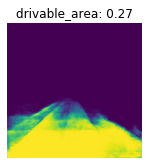

<Figure size 432x288 with 0 Axes>

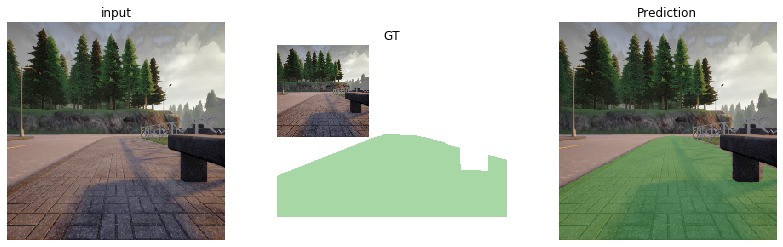

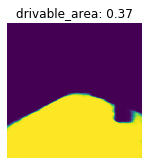

<Figure size 432x288 with 0 Axes>

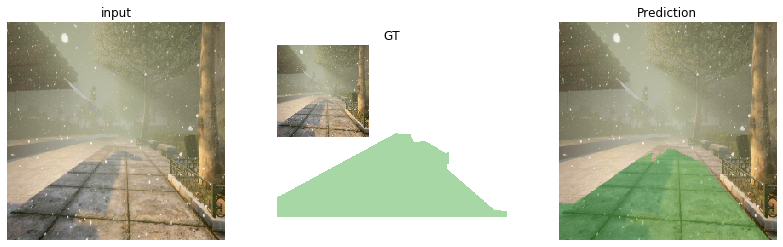

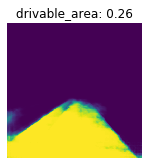

<Figure size 432x288 with 0 Axes>

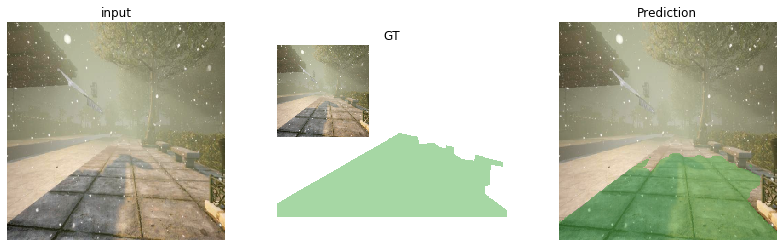

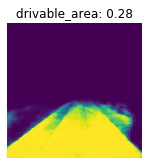

<Figure size 432x288 with 0 Axes>

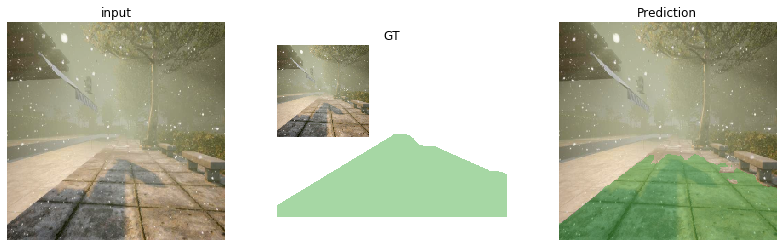

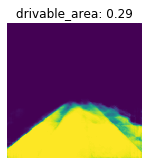

<Figure size 432x288 with 0 Axes>

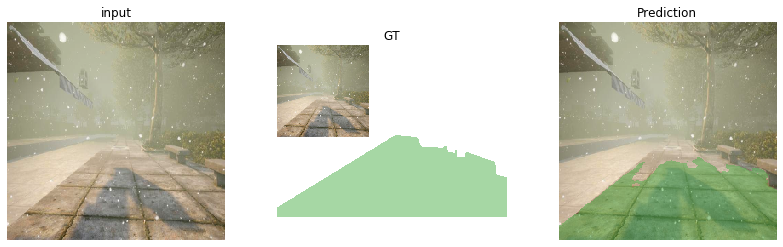

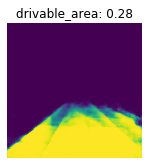

<Figure size 432x288 with 0 Axes>

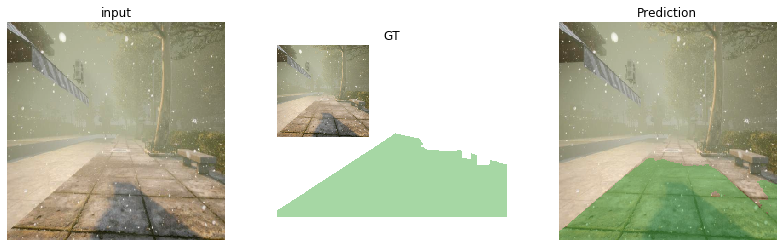

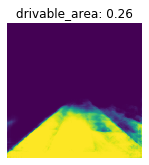

<Figure size 432x288 with 0 Axes>

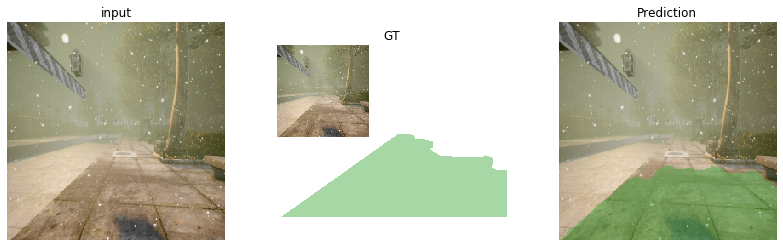

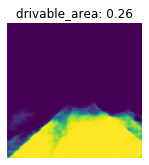

<Figure size 432x288 with 0 Axes>

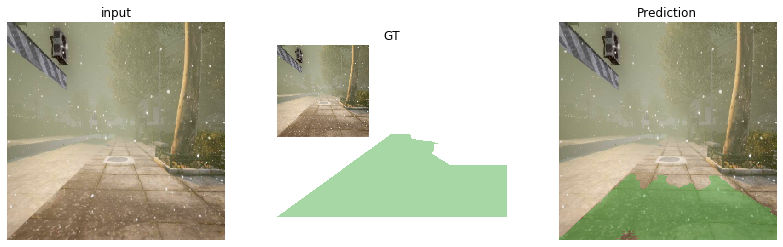

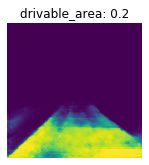

<Figure size 432x288 with 0 Axes>

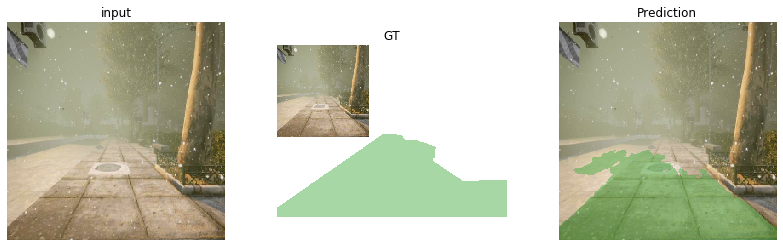

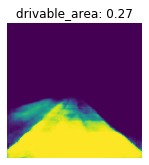

<Figure size 432x288 with 0 Axes>

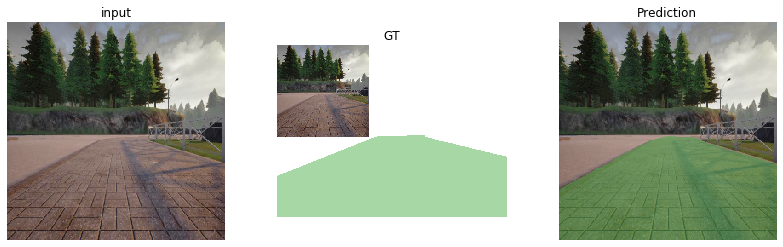

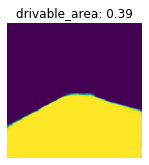

<Figure size 432x288 with 0 Axes>

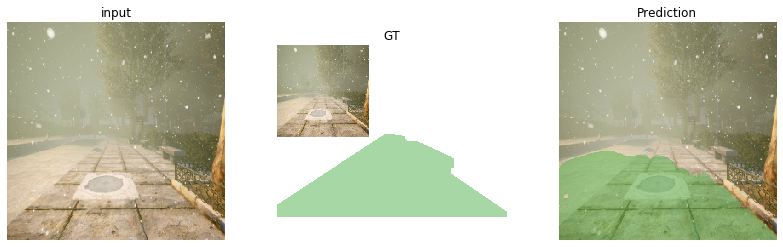

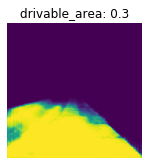

<Figure size 432x288 with 0 Axes>

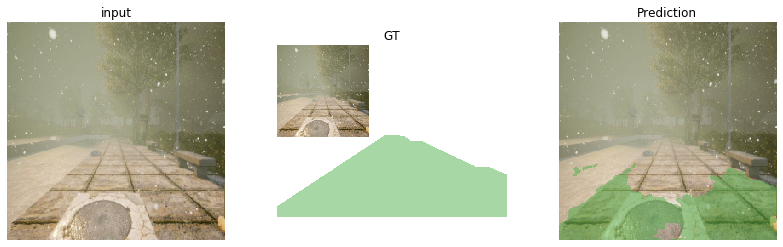

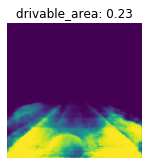

<Figure size 432x288 with 0 Axes>

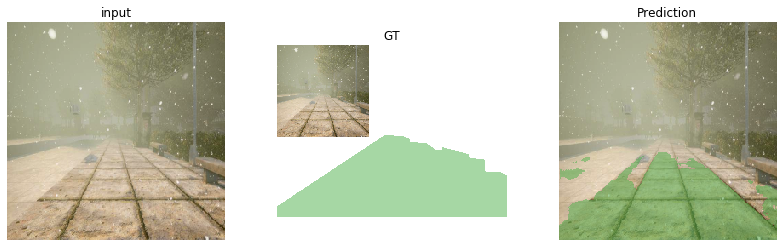

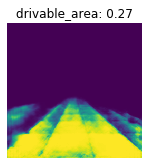

<Figure size 432x288 with 0 Axes>

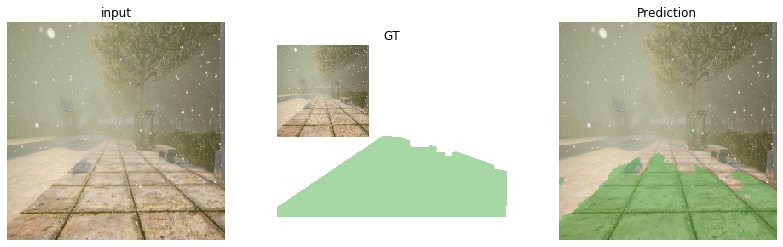

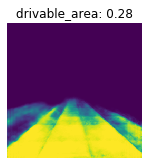

<Figure size 432x288 with 0 Axes>

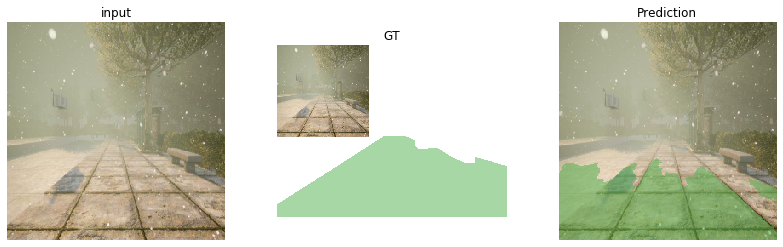

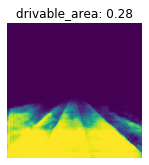

<Figure size 432x288 with 0 Axes>

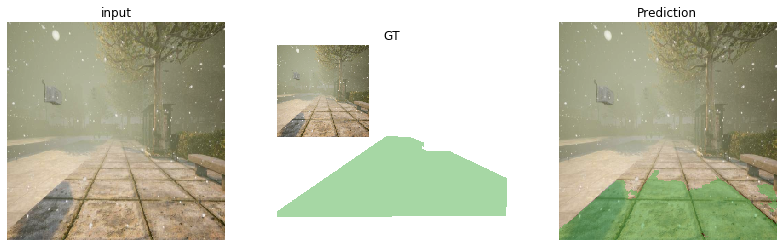

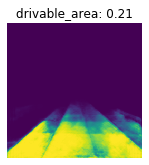

<Figure size 432x288 with 0 Axes>

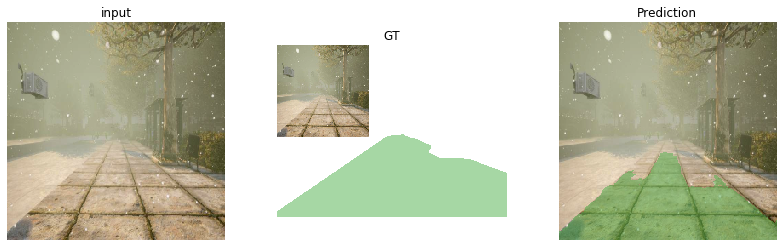

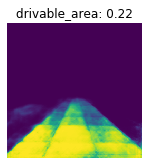

<Figure size 432x288 with 0 Axes>

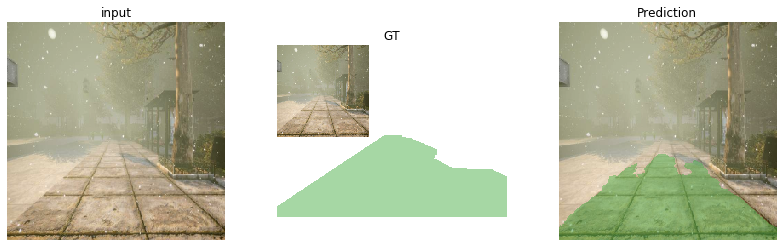

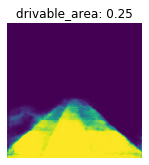

<Figure size 432x288 with 0 Axes>

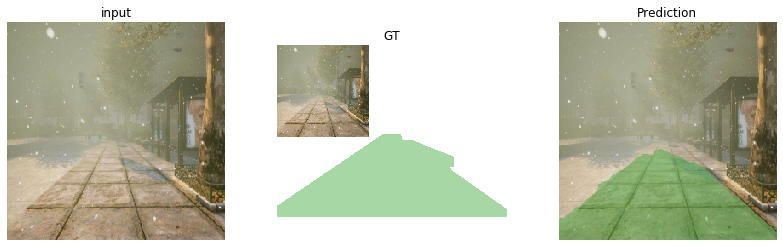

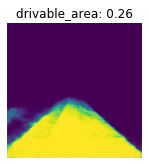

<Figure size 432x288 with 0 Axes>

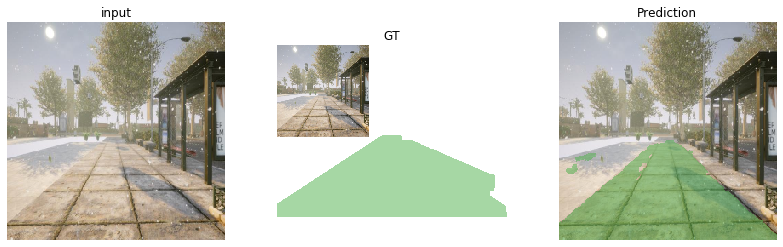

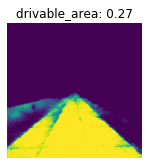

<Figure size 432x288 with 0 Axes>

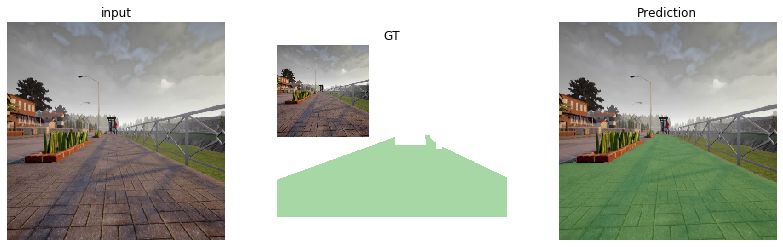

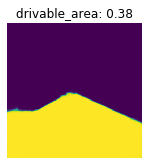

<Figure size 432x288 with 0 Axes>

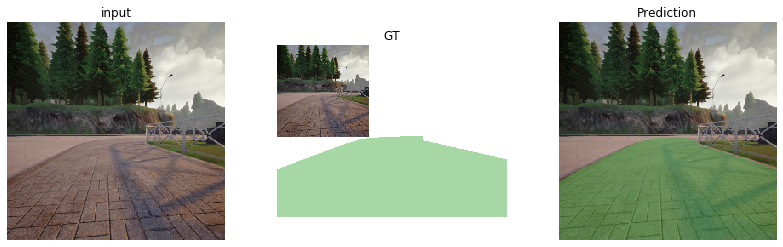

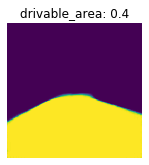

<Figure size 432x288 with 0 Axes>

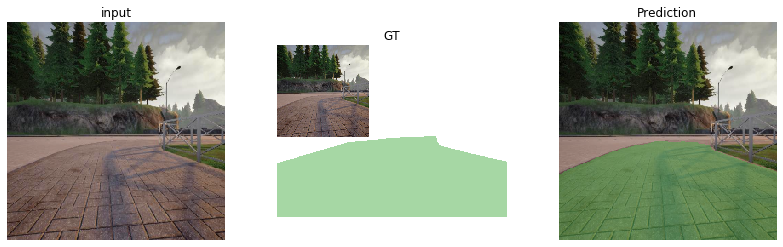

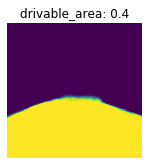

<Figure size 432x288 with 0 Axes>

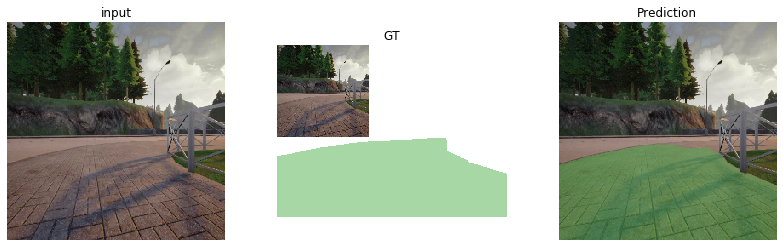

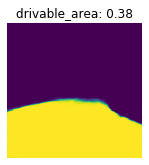

<Figure size 432x288 with 0 Axes>

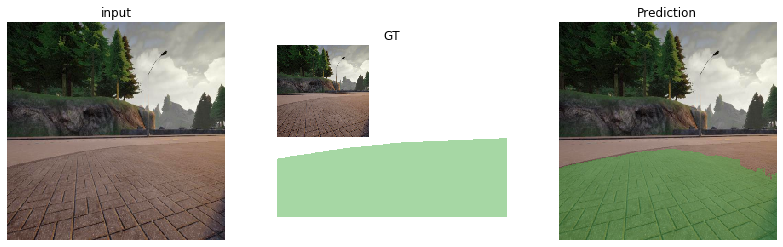

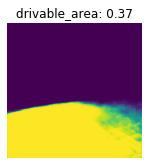

<Figure size 432x288 with 0 Axes>

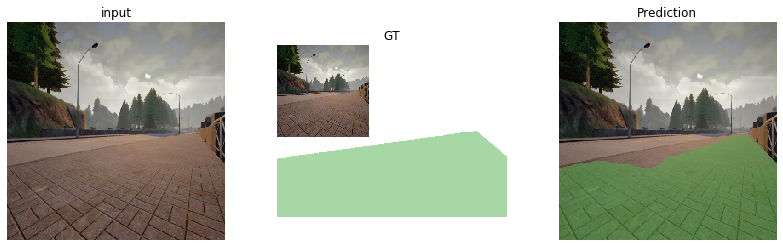

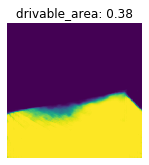

<Figure size 432x288 with 0 Axes>

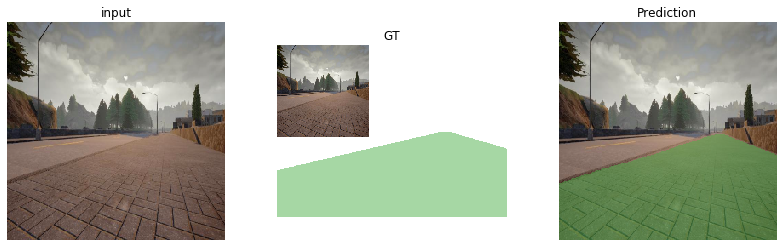

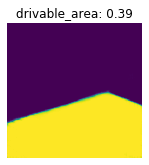

<Figure size 432x288 with 0 Axes>

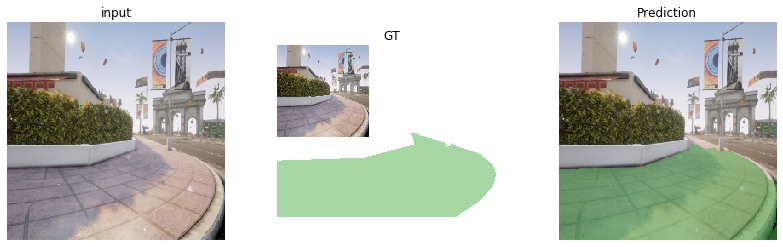

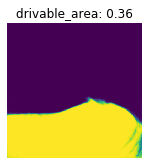

<Figure size 432x288 with 0 Axes>

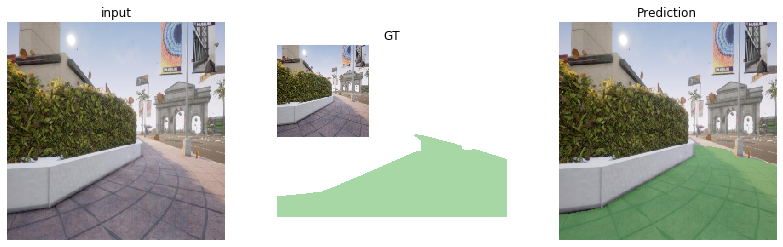

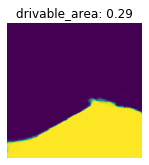

<Figure size 432x288 with 0 Axes>

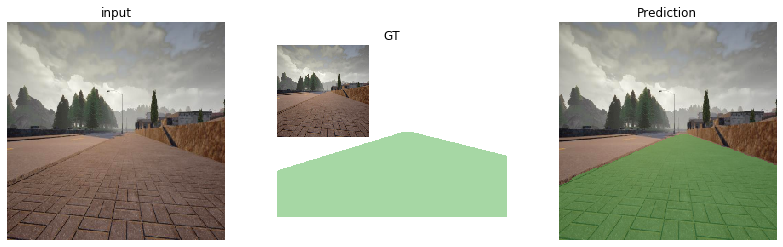

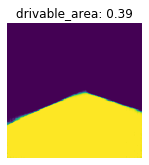

<Figure size 432x288 with 0 Axes>

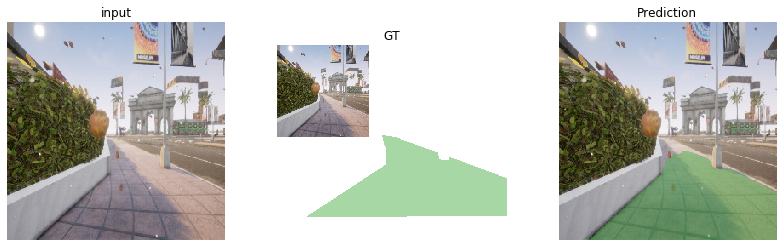

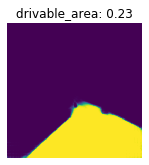

<Figure size 432x288 with 0 Axes>

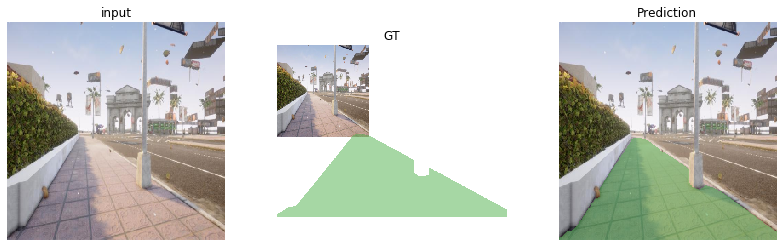

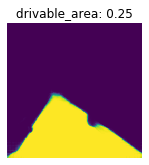

<Figure size 432x288 with 0 Axes>

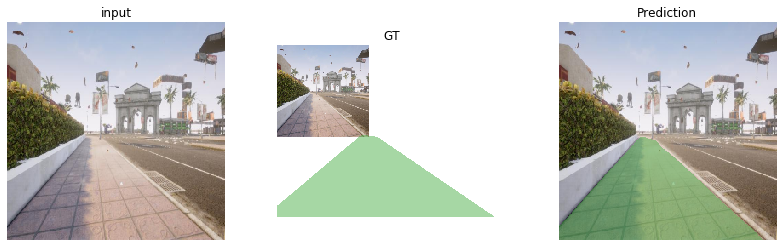

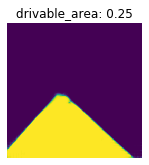

<Figure size 432x288 with 0 Axes>

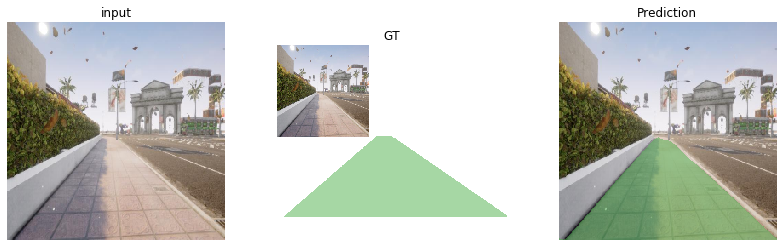

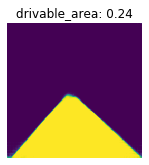

<Figure size 432x288 with 0 Axes>

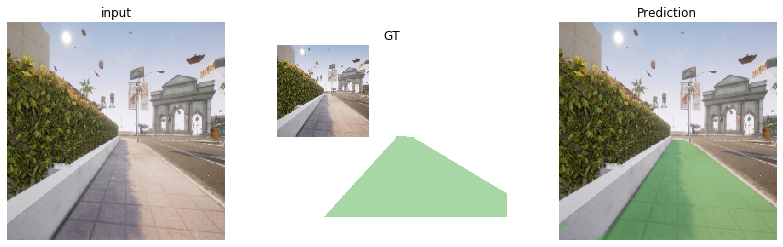

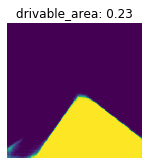

<Figure size 432x288 with 0 Axes>

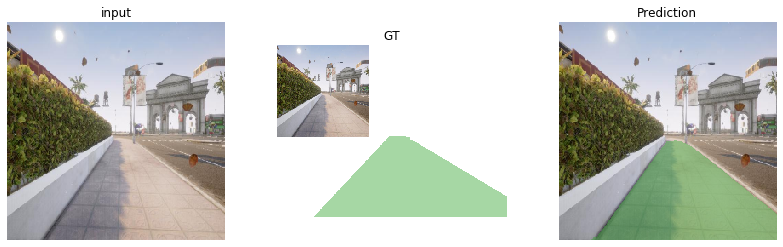

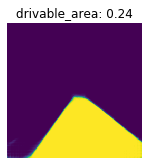

<Figure size 432x288 with 0 Axes>

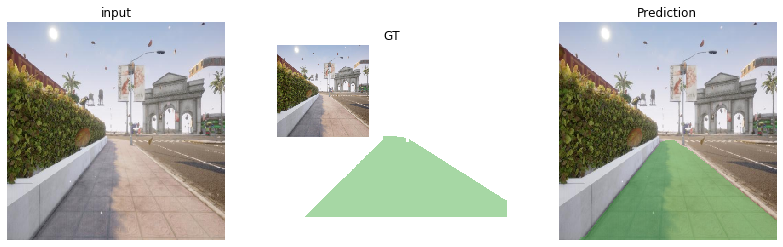

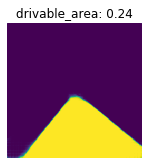

<Figure size 432x288 with 0 Axes>

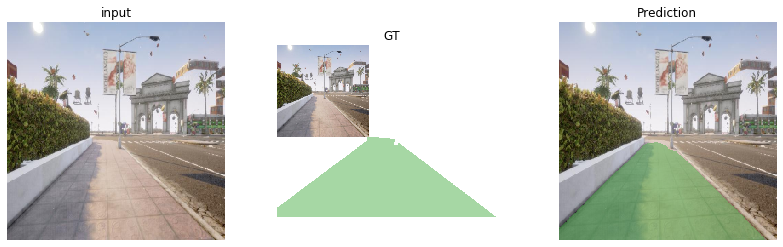

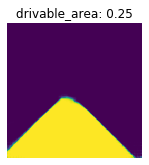

<Figure size 432x288 with 0 Axes>

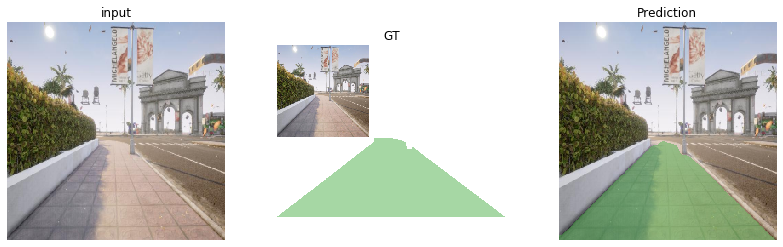

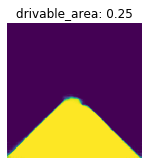

<Figure size 432x288 with 0 Axes>

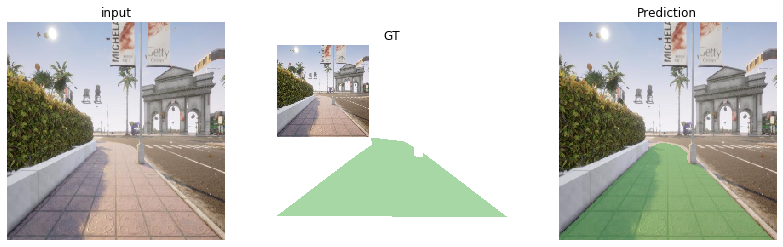

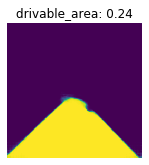

<Figure size 432x288 with 0 Axes>

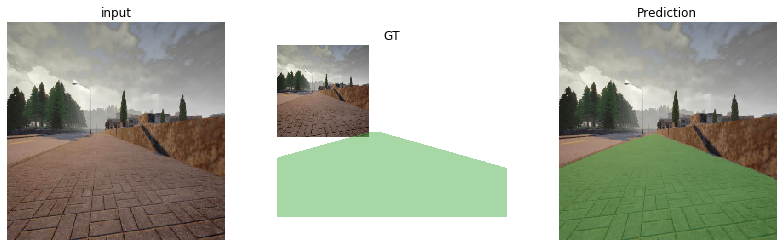

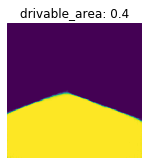

<Figure size 432x288 with 0 Axes>

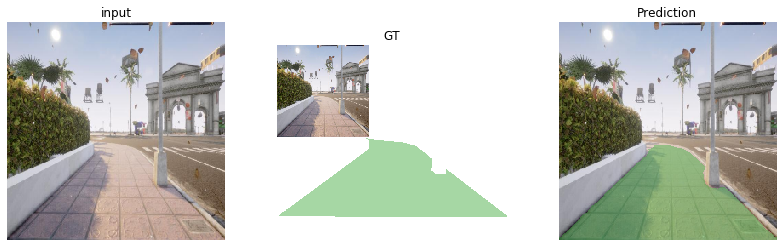

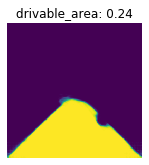

<Figure size 432x288 with 0 Axes>

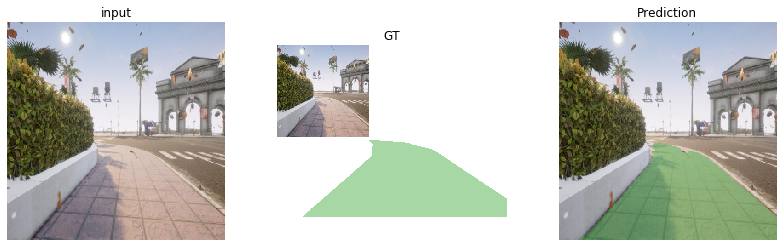

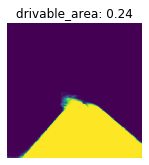

<Figure size 432x288 with 0 Axes>

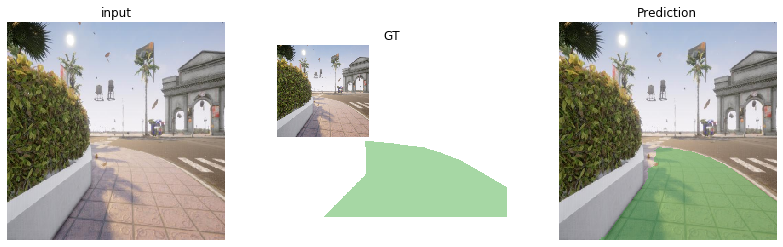

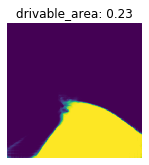

<Figure size 432x288 with 0 Axes>

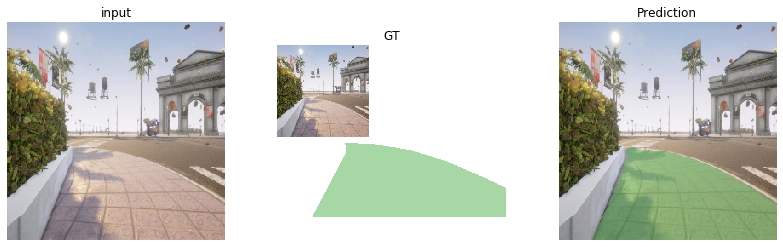

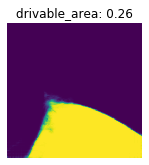

<Figure size 432x288 with 0 Axes>

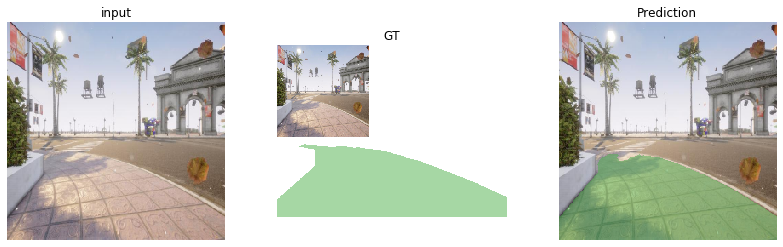

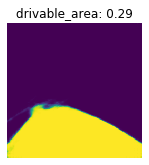

<Figure size 432x288 with 0 Axes>

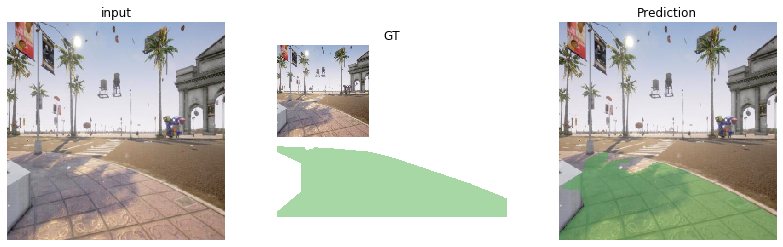

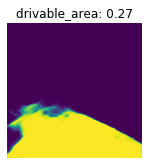

<Figure size 432x288 with 0 Axes>

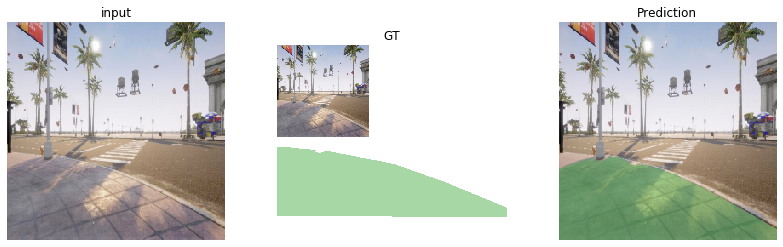

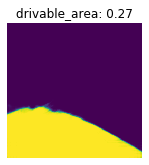

<Figure size 432x288 with 0 Axes>

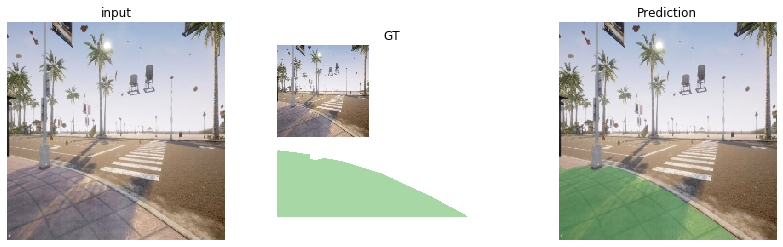

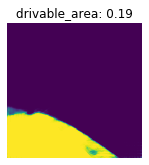

<Figure size 432x288 with 0 Axes>

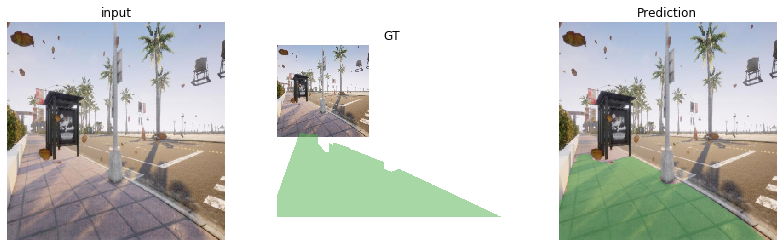

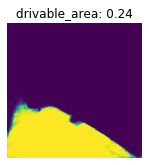

<Figure size 432x288 with 0 Axes>

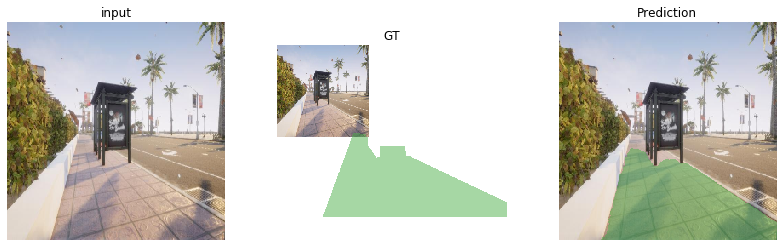

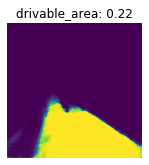

<Figure size 432x288 with 0 Axes>

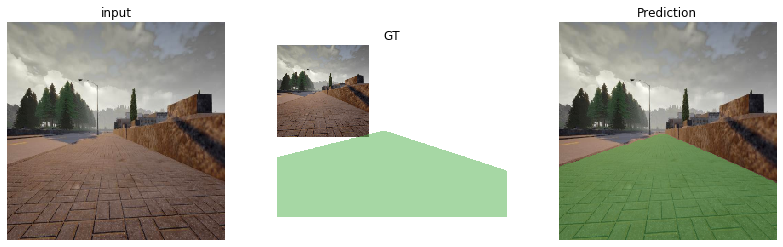

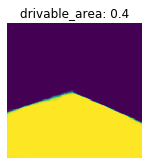

<Figure size 432x288 with 0 Axes>

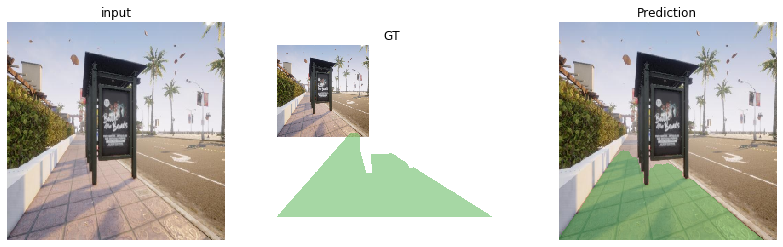

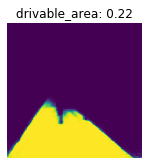

<Figure size 432x288 with 0 Axes>

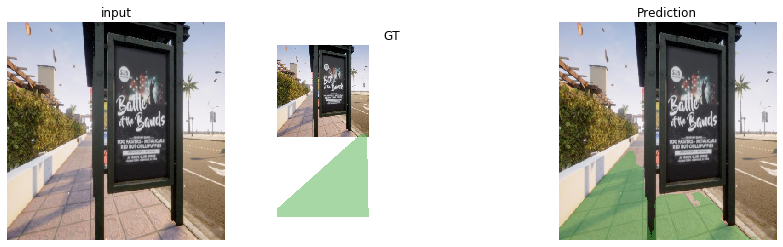

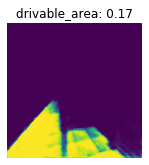

<Figure size 432x288 with 0 Axes>

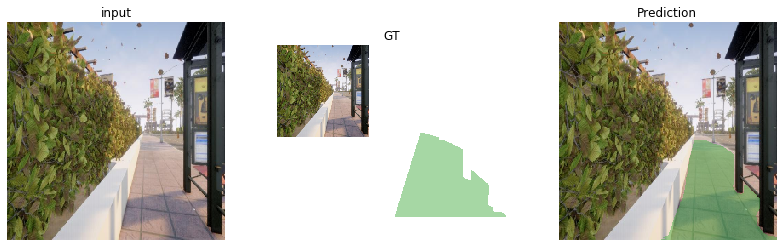

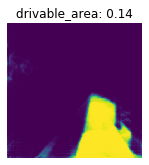

<Figure size 432x288 with 0 Axes>

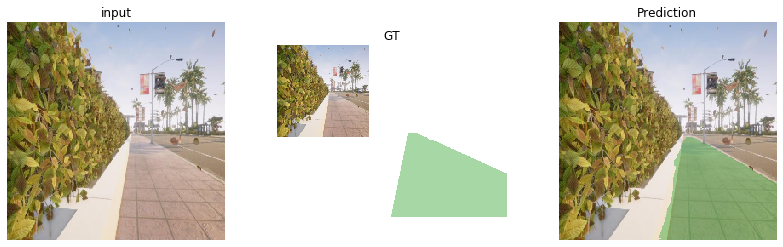

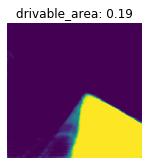

<Figure size 432x288 with 0 Axes>

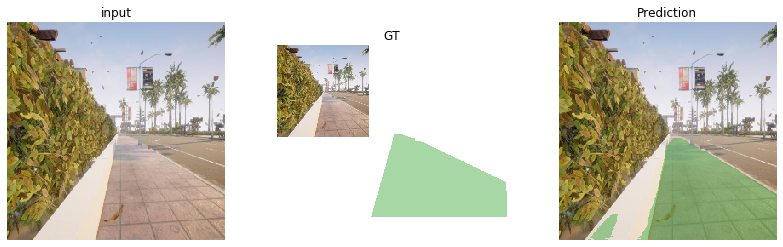

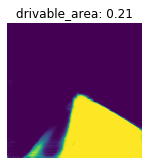

<Figure size 432x288 with 0 Axes>

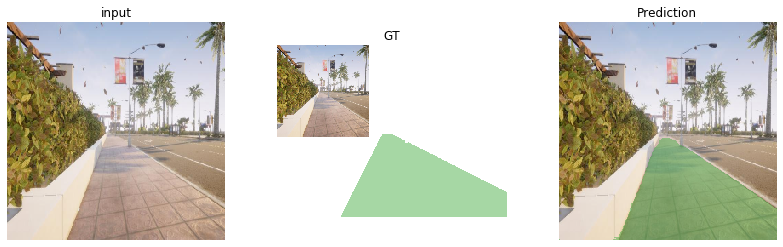

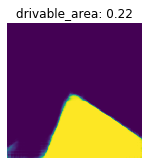

<Figure size 432x288 with 0 Axes>

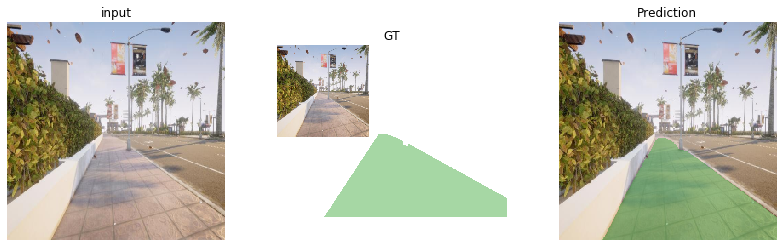

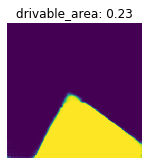

<Figure size 432x288 with 0 Axes>

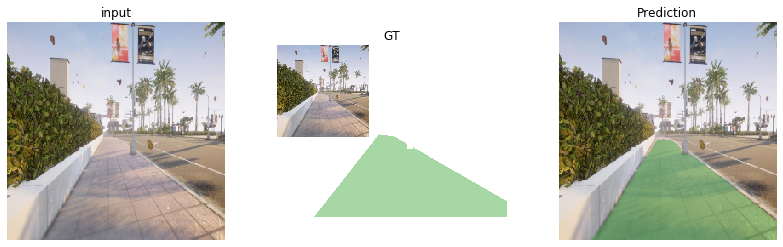

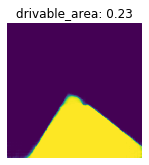

<Figure size 432x288 with 0 Axes>

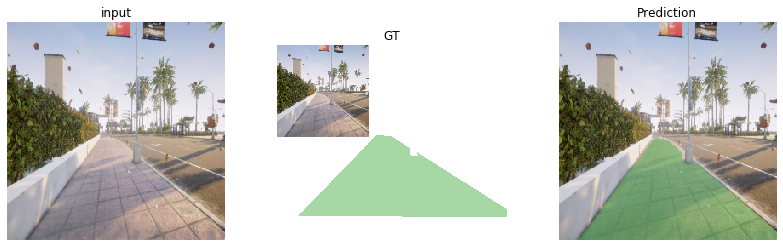

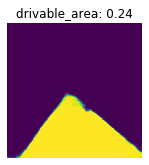

<Figure size 432x288 with 0 Axes>

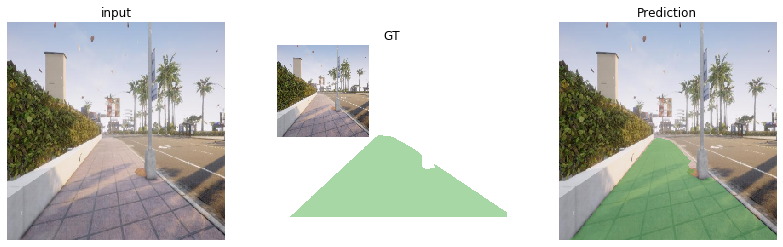

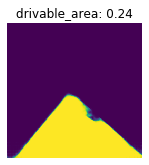

<Figure size 432x288 with 0 Axes>

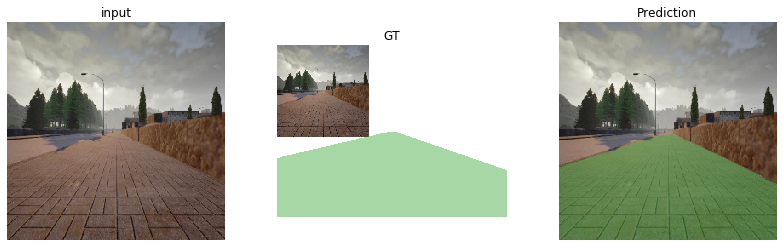

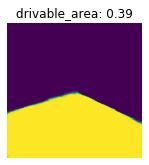

<Figure size 432x288 with 0 Axes>

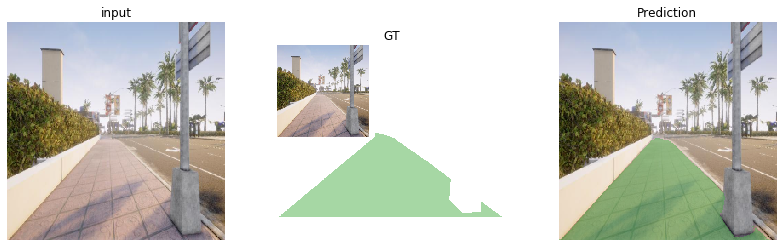

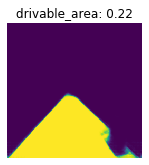

<Figure size 432x288 with 0 Axes>

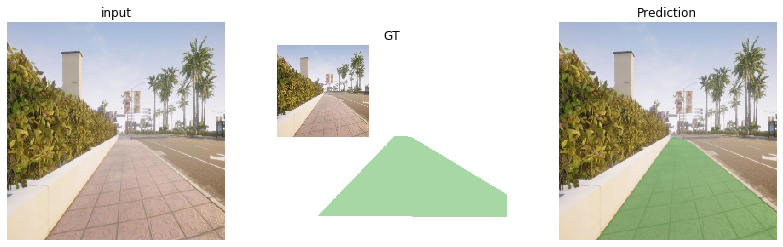

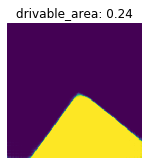

<Figure size 432x288 with 0 Axes>

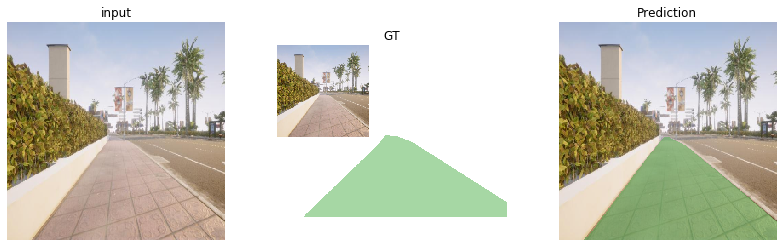

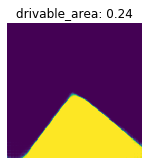

<Figure size 432x288 with 0 Axes>

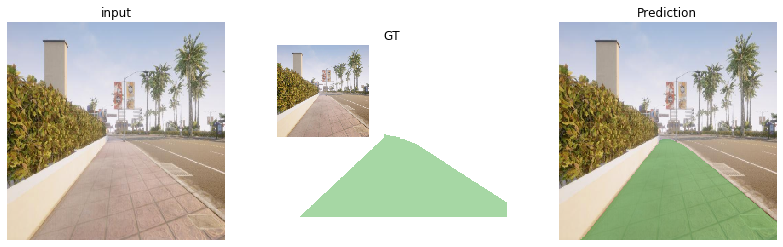

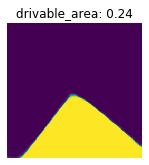

<Figure size 432x288 with 0 Axes>

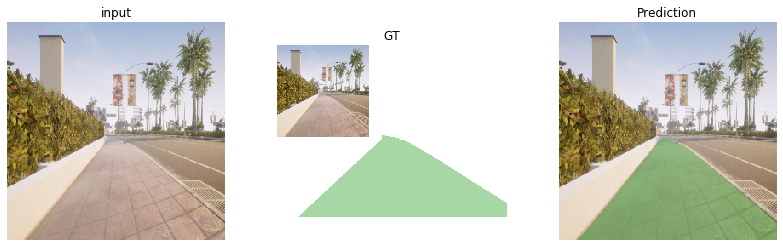

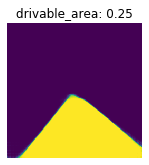

<Figure size 432x288 with 0 Axes>

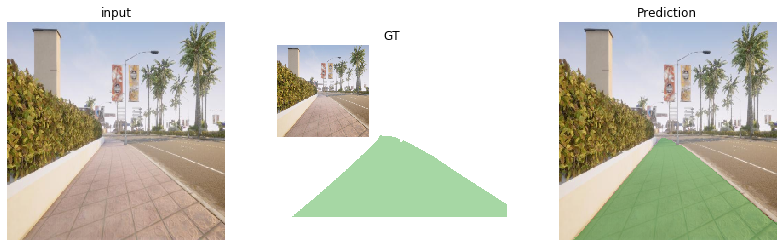

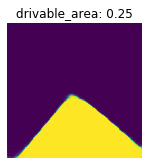

<Figure size 432x288 with 0 Axes>

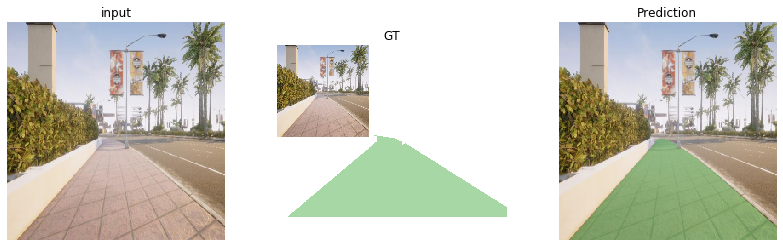

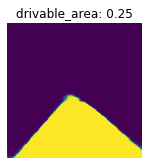

<Figure size 432x288 with 0 Axes>

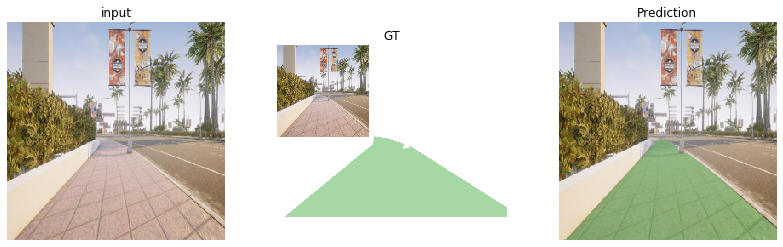

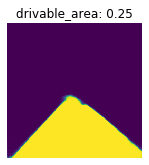

<Figure size 432x288 with 0 Axes>

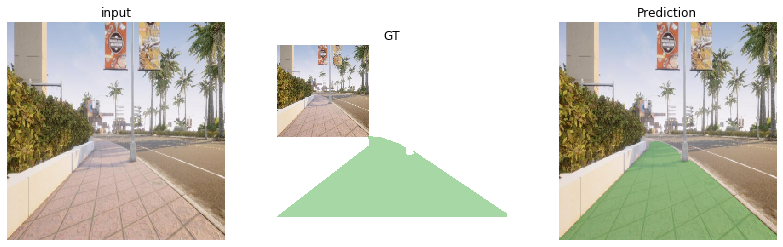

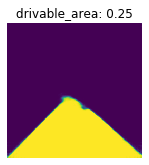

<Figure size 432x288 with 0 Axes>

In [29]:
model_pretrained = tf.keras.models.load_model('model_0.00003.h5', custom_objects={'masked_loss': masked_loss})
show_examples(model_pretrained)

In [ ]:
import cv2
image = cv2.imread('/home/imad/Documents/Side_walk_segmentation_work/Seg_train_test/JPEGImages/1285.jpg')
cv2.imshow("test", image)
#cv2.imwrite("test", image)
cv2.waitKey(0)
cv2.destroyAllWindows()